In [180]:
%matplotlib inline
import os
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from sklearn import preprocessing
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
import plotly.graph_objects as go
import statsmodels.api         as sm
import statsmodels.formula.api as smf
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
# always make it pretty 
plt.style.use('ggplot')
from practicum_utils import get_loggi_files, global_connect, run_query, explained_time, careful_query

In [2]:
db = global_connect()

In [3]:
agency = {'1': '6e7dacf2149d053183fe901e3cfd8b82', '2': '58cfe3b975dd7cbd1ac84d555640bfd9'}
ag = {'6e7dacf2149d053183fe901e3cfd8b82': '1', '58cfe3b975dd7cbd1ac84d555640bfd9': '2'}

In [4]:
df = careful_query("""
select *
from acceptance a
--where agency_id = '{0}'
""".format(agency['1']))

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 537468 entries, 0 to 537467
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   agency_id              537468 non-null  object        
 1   driver_id              537468 non-null  object        
 2   itinerary_id           537468 non-null  object        
 3   offer_time             537468 non-null  datetime64[ns]
 4   availability           537468 non-null  bool          
 5   intensity_pushes       537468 non-null  int64         
 6   distance_to_agency     536032 non-null  float64       
 7   driver_position_lat    386368 non-null  float64       
 8   driver_position_lng    386368 non-null  float64       
 9   previous_work          537468 non-null  int64         
 10  previous_work_10_days  537468 non-null  int64         
 11  label                  537468 non-null  bool          
dtypes: bool(2), datetime64[ns](1), float64(3), i

In [6]:
df.isnull().sum()

agency_id                     0
driver_id                     0
itinerary_id                  0
offer_time                    0
availability                  0
intensity_pushes              0
distance_to_agency         1436
driver_position_lat      151100
driver_position_lng      151100
previous_work                 0
previous_work_10_days         0
label                         0
dtype: int64

In [7]:
for key, value in ag.items():
    df.loc[df.agency_id == key, 'agency_id'] = value

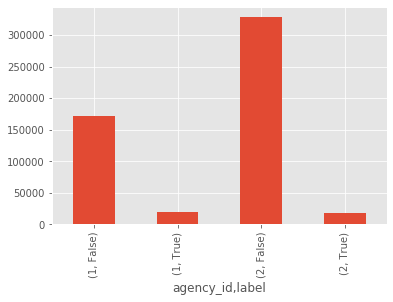

In [8]:
df.groupby([df.agency_id, df.label]).label.count().plot.bar();

agency_id  label
1          False    0.899115
           True     0.100885
2          False    0.948741
           True     0.051259
Name: label, dtype: float64

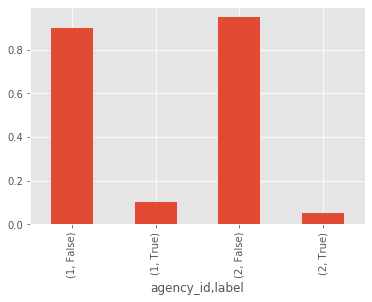

In [9]:
dft = df.groupby([df.agency_id, df.label]).label.count()
pct = dft / dft.groupby('agency_id').sum()
pct.plot.bar()
pct

- Agency 1: in average there is accepted one offer every 10
- Agency 2: in average there is accepted one offer every 20

In [10]:
cols = ['driver_position_lat', 'driver_position_lng']
df[df.label][cols].dropna().info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29315 entries, 0 to 537449
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   driver_position_lat  29315 non-null  float64
 1   driver_position_lng  29315 non-null  float64
dtypes: float64(2)
memory usage: 687.1 KB


In [84]:
df.offer_time.min(), df.offer_time.max()

(Timestamp('2019-09-30 07:29:50'), Timestamp('2020-04-03 16:48:06'))

In [11]:
fig = go.Figure()

fig.add_trace(go.Scattermapbox(
    mode = "markers",
    lat = df[df.label].driver_position_lat.values[:],
    lon = df[df.label].driver_position_lng.values[:],
    marker = {'size': 5, 'color': 'rgba(255, 100, 100, 0.5)'}))

# test this for auto centering:
fig.update_geos(fitbounds="locations")

fig.update_layout(
    margin ={'l':0,'t':0,'b':0,'r':0},
    mapbox = {
        #'accesstoken': 'TOKEN',
        'center': {'lat': df[df.label].driver_position_lat.mean(),
                   'lon': df[df.label].driver_position_lng.mean()},
        'style': 'carto-positron', #'open-street-map',
        'zoom': 10})

fig.show()

In [12]:
df.groupby([df.agency_id, df.label]).distance_to_agency.describe()

count       mean         std  min       25%       50%  \
agency_id label                                                             
1         False  171201.0   1.125299    2.274467 -1.0 -1.000000  0.024062   
          True    19255.0   0.896191    2.001390 -1.0  0.007263  0.022311   
2         False  327875.0  15.372051  387.795795 -1.0 -1.000000  1.153406   
          True    17701.0  22.039601  490.650099 -1.0  0.014099  0.622794   

                      75%           max  
agency_id label                          
1         False  3.292561      6.172470  
          True   2.046628      6.005059  
2         False  2.833485  13184.008965  
          True   2.119460  13181.918515

- mean distance for agency 2 doesn't look good. Looking at max value we see that maybe we have some weird outliers. We will need to resolve this before using trusting in descriptive statistics.

In [13]:
condition = (df.agency_id == '2') & (df.distance_to_agency > 50)
df[condition].distance_to_agency.count()

590

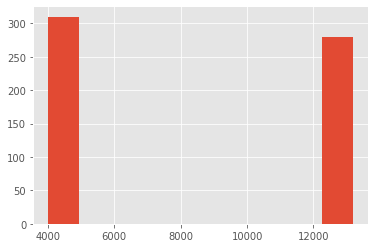

In [14]:
df[condition].distance_to_agency.hist()

In [15]:
df[condition].driver_id.nunique()

109

In [16]:
df[condition].groupby(df.label).label.count()

label
False    550
True      40
Name: label, dtype: int64

In [17]:
# What to do with these 590 rejections that were located to more than 4.000 and 12.000 Km ???
# 1) Set it to null
# 2) Set it to 0
# 3) Set it to an agency driver's average distance
# 4) Set it to tipical same driver average distance (without outliers)
# 5) Set to similar drivers distance (no time for this)
# 6) Drop rows (don't like this path)

In [18]:
cond = (df.agency_id == '2') & (df.distance_to_agency < 50)
agency_avg_distance = df[cond].distance_to_agency.mean()
# Try to go with option 4
for idx in df[condition].index:
    r = df[df.index == idx]
    md = df[cond & (df.driver_id == r.driver_id.item())].distance_to_agency
    if len(md) > 0:
        # option 4
        md = md.mean()
        if md < 0: md = -1
    else:
        # if not then option 3
        md = agency_avg_distance

    df.loc[df.index==idx, 'distance_to_agency'] = md

In [19]:
df.groupby([df.agency_id, df.label]).distance_to_agency.describe()

count      mean       std  min       25%       50%  \
agency_id label                                                          
1         False  171201.0  1.125299  2.274467 -1.0 -1.000000  0.024062   
          True    19255.0  0.896191  2.001390 -1.0  0.007263  0.022311   
2         False  327875.0  1.450333  2.028241 -1.0 -1.000000  1.149709   
          True    17701.0  1.056915  1.746272 -1.0  0.014086  0.620145   

                      75%        max  
agency_id label                       
1         False  3.292561   6.172470  
          True   2.046628   6.005059  
2         False  2.832771  16.657608  
          True   2.107065  12.339176

- Minimum distance -1 means that was not possible to obtain drivers location looking at the availability data set. Are Loggi sending messages to drivers outside the area we have received? Or is Loggi sending request to drivers that are not working at requesting time?
- Avg distance for accepted itineraries tends to be shorter than distance for rejected itineraries.
- Looking at the median we can see that agency 1's drivers tend to be at the agency when accepting but at the same time drivers are at the agency when rejecting. It is possible that these drivers becouse of being at the agency receive too many requests per driver and he/she has not time to decide and ignore them.
- Agency 2's drivers tend to be closer to the agency when accepting in comparison when rejecting, but at the same time they not wait for work at the agency.
- We took calculate the distance to the driver using data in availability data set. So, it is truncated data. The agency area radius is no more than 6 or 7 km. So, if we have distances that exceed 6 or 7 km, we could suspect of drivers that are going from one agency zone to the other. Using this knowledge and looking at agencies drivers max distances, we can think that there are drivers at agency 2 that have worked at agency 1 zone, but not many drivers at agency 1 that have worked at agency 2.

### At what distance was the driver when he/she received the job request?

Agency 1 max accepted distance: 6.005058739731058
Agency 2 max accepted distance: 12.339175685076627


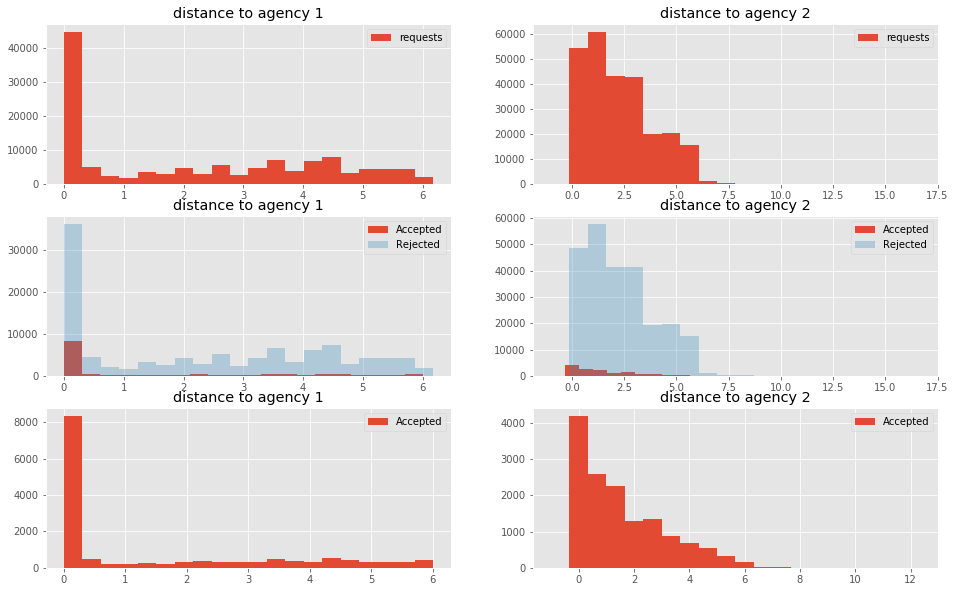

In [20]:
fig, axes = plt.subplots(3, 2, figsize=(16,10))
axes = axes.flatten()
for i, (a, g) in enumerate(df.groupby([df.agency_id])):
    g = g.dropna()
    axes[i].hist(g.distance_to_agency, bins=20, label='requests')
    axes[i].legend()
    axes[i].set_title('distance to agency {}'.format(a))
    
    axes[i+2].hist(g[g.label==True].distance_to_agency, bins=20, label='Accepted')
    axes[i+2].hist(g[g.label==False].distance_to_agency, bins=20, label='Rejected', alpha=0.3)
    axes[i+2].legend()
    axes[i+2].set_title('distance to agency {}'.format(a))

    axes[i+4].hist(g[g.label==True].distance_to_agency, bins=20, label='Accepted')   
    axes[i+4].legend()
    axes[i+4].set_title('distance to agency {}'.format(a))
    
    print('Agency {} max accepted distance: {}'.format(a, g[g.label==True].distance_to_agency.max()))


- The closer to the agency, the more likely to be notified by Loggi.
- The closer to the agency, the more likely to accept an itinerary.
- Agency 1 looks like if all drivers were going directly to the agency looking for work before checking the app.

In [21]:
def plot_density_map(lat, lng, radious=5):

    fig = go.Figure()

    fig.add_trace(go.Densitymapbox(lat=lat, lon=lng, radius=radious))
    
    # test this for auto centering:
    fig.update_geos(fitbounds="locations")

    fig.update_layout(
        margin ={'l':0,'t':0,'b':0,'r':0},
        mapbox = {
            #'accesstoken': 'TOKEN',
            'center': {'lat': lat.mean(),
                       'lon': lng.mean()},
            'style': 'carto-positron', #'open-street-map',
            'zoom': 10})

    fig.show()

### Where was each driver when he/she was requested?

In [22]:
dft = df.dropna().sample(20000)
plot_density_map(dft.driver_position_lat.values, dft.driver_position_lng.values, radious=3)

### Where was each driver when he/she accepted the job?

In [23]:
dft = df[df.label][['driver_position_lat','driver_position_lng']].dropna().sample(20000)
plot_density_map(dft.driver_position_lat.values, dft.driver_position_lng.values, radious=3)

### Where was each driver when he/she rejected the job?

In [24]:
dft = df[df.label == False][['driver_position_lat','driver_position_lng']].dropna().sample(20000)
plot_density_map(dft.driver_position_lat.values, dft.driver_position_lng.values, radious=3)

The rejection locations tend to be more spread. The iluminated area is bigger in the whole agencies areas.

In [25]:
df.describe()

,intensity_pushes,distance_to_agency,driver_position_lat,driver_position_lng,previous_work,previous_work_10_days
count,537468.000000,536032.000000,386368.000000,386368.000000,537468.000000,537468.000000
mean,5.236288,1.313625,-23.531915,-46.617762,10.787314,2.120826
std,4.902092,2.108144,0.048317,0.075025,21.166972,3.839745
min,0.000000,-1.000000,-23.615931,-46.727539,0.000000,0.000000
25%,0.000000,-1.000000,-23.565948,-46.673820,1.000000,0.000000
50%,4.000000,0.889726,-23.554512,-46.658930,3.000000,0.000000
75%,10.000000,2.835468,-23.471902,-46.524810,10.000000,2.000000
max,131.000000,16.657608,-23.414240,-46.454178,232.000000,44.000000


In [26]:
df[df.intensity_pushes > 13].intensity_pushes.sort_values(ascending=False)

452410    131
53275      83
219320     70
280549     70
386645     70
         ... 
412518     14
412166     14
412165     14
412159     14
356991     14
Name: intensity_pushes, Length: 8856, dtype: int64

- We have counted pushes in last driver hour to calculate intesity pushes. We suppose that there was only at leas as 13 pushes in an hour because messages go in period of 5 minutes.
- User using two devices and then double counting?

In [27]:
df[df.intensity_pushes > 26].intensity_pushes.sort_values(ascending=False)

452410    131
53275      83
386645     70
219320     70
280549     70
         ... 
359755     27
316376     27
293897     27
222632     27
533850     27
Name: intensity_pushes, Length: 82, dtype: int64

In [28]:
df[df.intensity_pushes > 26].driver_id.nunique()

19

In [29]:
df[df.intensity_pushes == 131]

,agency_id,driver_id,itinerary_id,offer_time,availability,intensity_pushes,distance_to_agency,driver_position_lat,driver_position_lng,previous_work,previous_work_10_days,label
452410,2,0ab733490f81e4326ddd7512663c9036,6051d567b04000c63b1bb0030ef98da9,2019-12-13 07:04:12,True,131,2.538427,-23.560301,-46.694294,7,4,False


In [30]:
careful_query("""
    select count(1) from availability
    where driver_id = '0ab733490f81e4326ddd7512663c9036'
""")

,count
0,7419


Maybe there push can be generated by the user and this day this drivers made 131 pushes in an hour

In [31]:
# Let's set 13 as max intensity

In [32]:
df.loc[df.intensity_pushes > 13, 'intensity_pushes'] = 13

In [33]:
df.describe()

,intensity_pushes,distance_to_agency,driver_position_lat,driver_position_lng,previous_work,previous_work_10_days
count,537468.000000,536032.000000,386368.000000,386368.000000,537468.000000,537468.000000
mean,5.168752,1.313625,-23.531915,-46.617762,10.787314,2.120826
std,4.739179,2.108144,0.048317,0.075025,21.166972,3.839745
min,0.000000,-1.000000,-23.615931,-46.727539,0.000000,0.000000
25%,0.000000,-1.000000,-23.565948,-46.673820,1.000000,0.000000
50%,4.000000,0.889726,-23.554512,-46.658930,3.000000,0.000000
75%,10.000000,2.835468,-23.471902,-46.524810,10.000000,2.000000
max,13.000000,16.657608,-23.414240,-46.454178,232.000000,44.000000


In [34]:
df.availability = df.availability.astype('int')
df.label = df.label.astype('int')

In [35]:
df.describe()

,availability,intensity_pushes,distance_to_agency,driver_position_lat,driver_position_lng,previous_work,previous_work_10_days,label
count,537468.000000,537468.000000,536032.000000,386368.000000,386368.000000,537468.000000,537468.000000,537468.000000
mean,0.702918,5.168752,1.313625,-23.531915,-46.617762,10.787314,2.120826,0.068955
std,0.456973,4.739179,2.108144,0.048317,0.075025,21.166972,3.839745,0.253377
min,0.000000,0.000000,-1.000000,-23.615931,-46.727539,0.000000,0.000000,0.000000
25%,0.000000,0.000000,-1.000000,-23.565948,-46.673820,1.000000,0.000000,0.000000
50%,1.000000,4.000000,0.889726,-23.554512,-46.658930,3.000000,0.000000,0.000000
75%,1.000000,10.000000,2.835468,-23.471902,-46.524810,10.000000,2.000000,0.000000
max,1.000000,13.000000,16.657608,-23.414240,-46.454178,232.000000,44.000000,1.000000


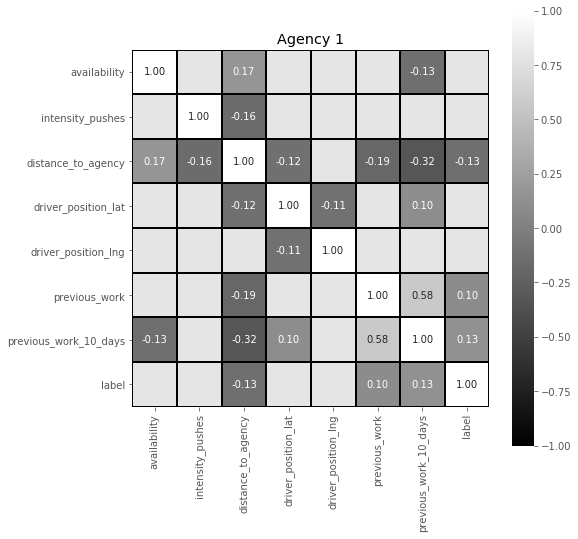

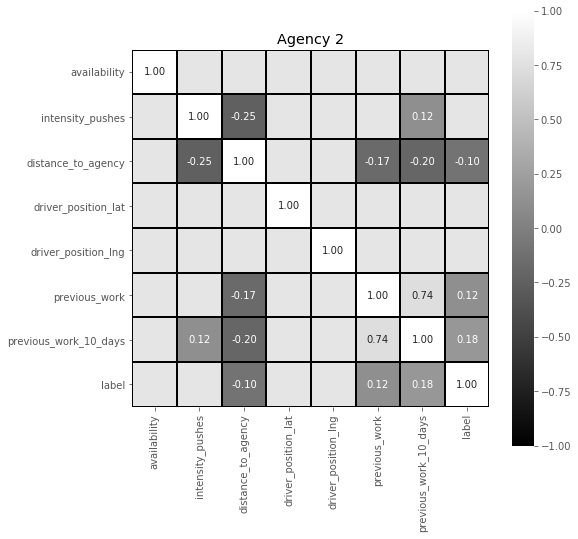

In [36]:
for a, g in df.dropna().groupby('agency_id'):
    plt.figure(figsize=(8,8))
    sns.heatmap(g.corr()[g.corr().abs() > 0.1], vmin=-1, vmax=1, annot = True, square = True,
       center= 0, cmap= 'gray', linewidths=1, linecolor='black', fmt='.2f').set_title('Agency {}'.format(a))

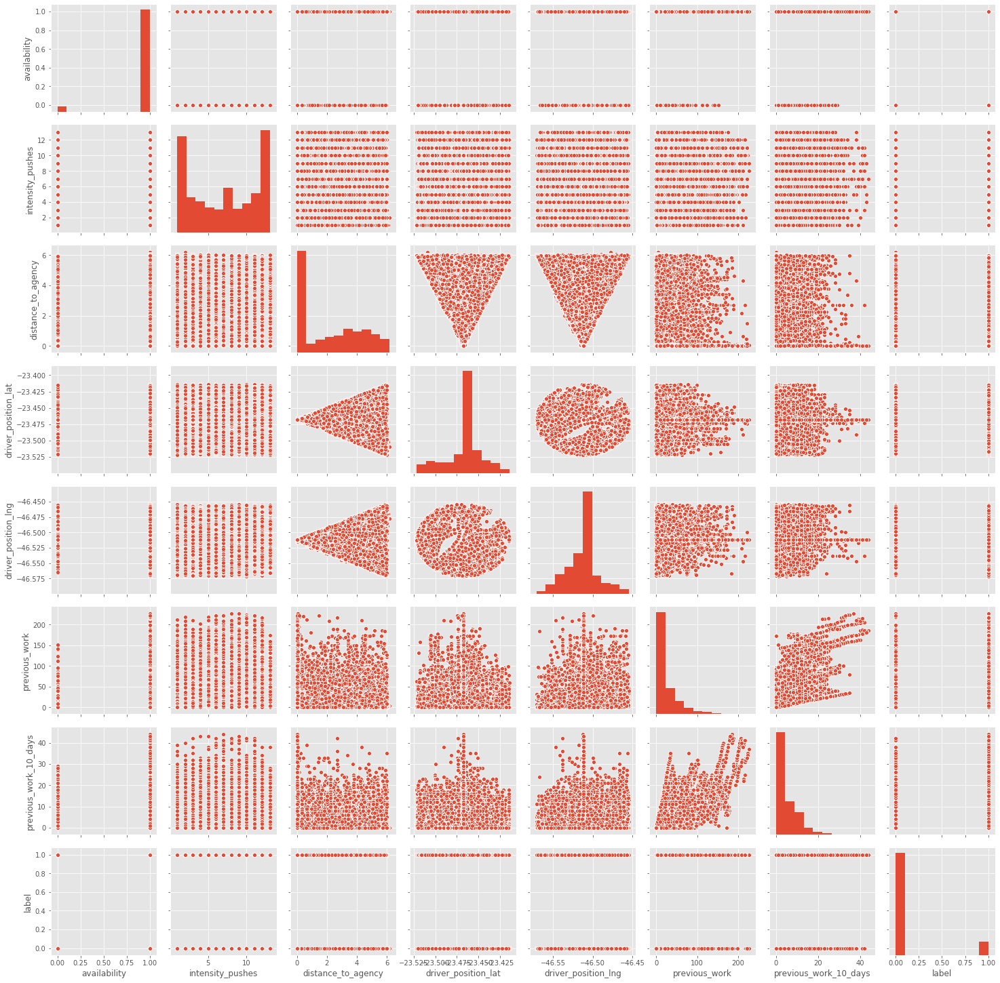

In [37]:
dft = df.dropna()
sns.pairplot(dft[dft.agency_id == '1'].select_dtypes('number'));

TODO: comment the above scatterplots!

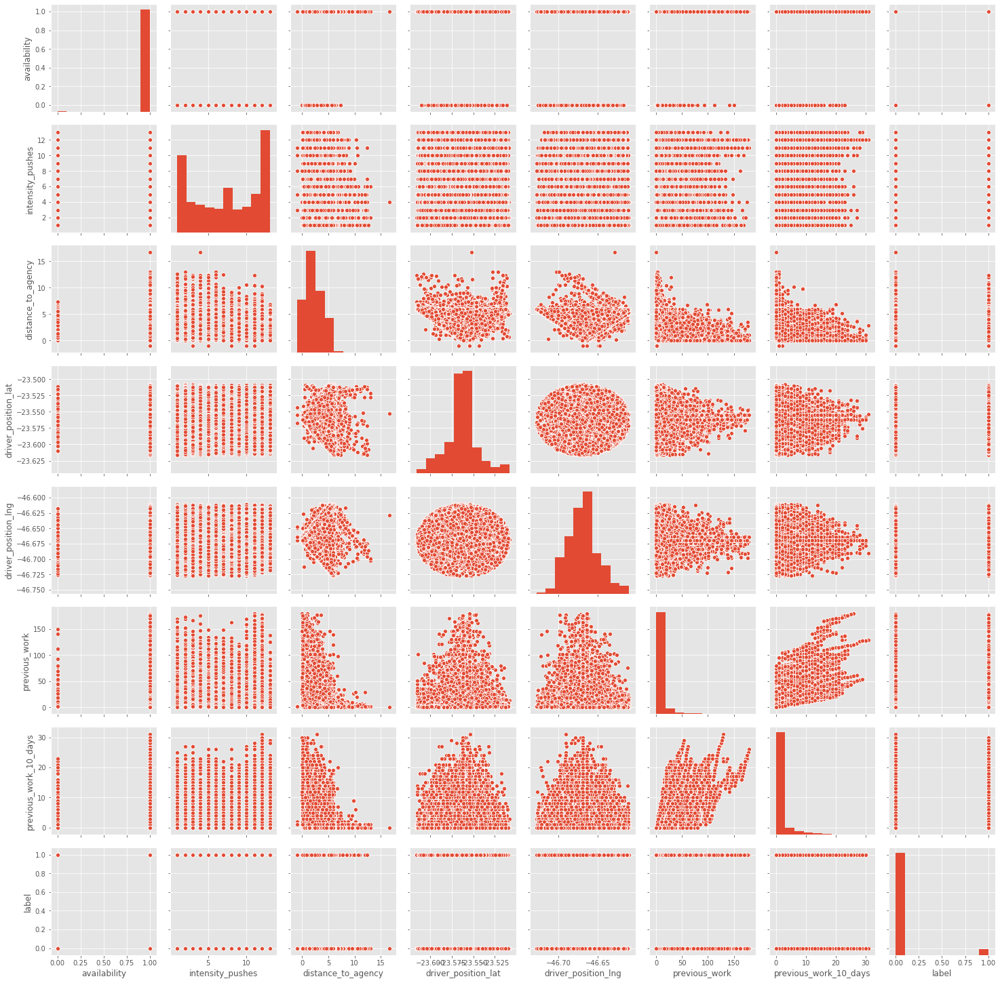

In [38]:
dft = df.dropna()
sns.pairplot(dft[dft.agency_id == '2'].select_dtypes('number'));

TODO: comment the above scatterplots!

In [39]:
columns = [col for col in df.columns if 'position' not in col]
df[df.agency_id == '1'][columns].isna().sum()

agency_id                   0
driver_id                   0
itinerary_id                0
offer_time                  0
availability                0
intensity_pushes            0
distance_to_agency       1197
previous_work               0
previous_work_10_days       0
label                       0
dtype: int64

In [40]:
avg_dist = df[(df.agency_id == '1') & (df.distance_to_agency.notnull())].distance_to_agency.mean()
df.loc[(df.agency_id == '1') & (df.distance_to_agency.isnull()), 'distance_to_agency'] = avg_dist

avg_dist = df[(df.agency_id == '2') & (df.distance_to_agency.notnull())].distance_to_agency.mean()
df.loc[(df.agency_id == '2') & (df.distance_to_agency.isnull()), 'distance_to_agency'] = avg_dist

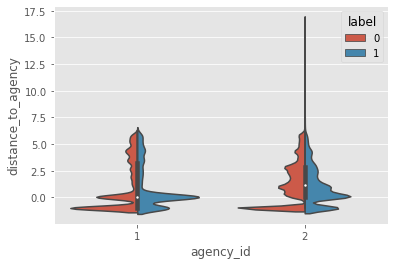

In [41]:
sns.violinplot(x='agency_id', y='distance_to_agency', hue='label', data=df, split=True);

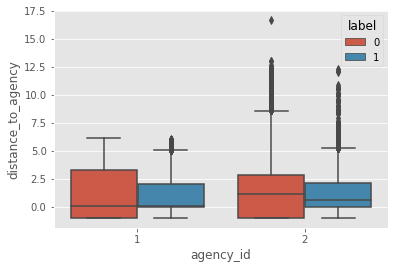

In [42]:
sns.boxplot(x='agency_id', y='distance_to_agency', hue='label', data=df);

- Distance is a clear feature that is related with acceptation

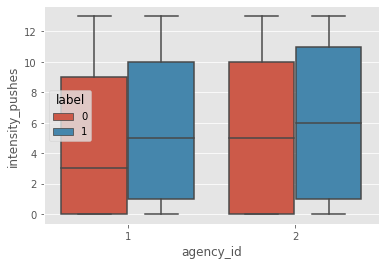

In [43]:
sns.boxplot(x='agency_id', y='intensity_pushes', hue='label', data=df);

- Intensity Pushes is related too.

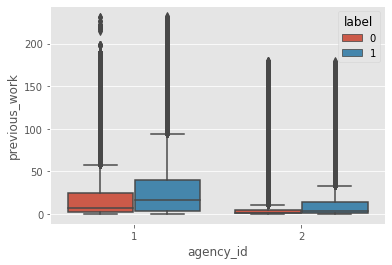

In [44]:
sns.boxplot(x='agency_id', y='previous_work', hue='label', data=df);

-  This feature present many outliers

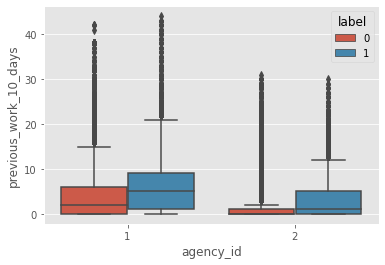

In [45]:
sns.boxplot(x='agency_id', y='previous_work_10_days', hue='label', data=df);

- This feature too presents many outliers but again there is some relation. Blue dominate red. The more you work in previous ten days, the more likely you will accept a job.

In [56]:
dft = df[df.agency_id == '1'][columns].dropna().copy()
dft['Intercept'] = 1

X = dft[[col for col in dft.select_dtypes('number') if col != 'label']]
y = dft['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.307752
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               191653
Model:                          Logit   Df Residuals:                   191647
Method:                           MLE   Df Model:                            5
Date:                Mon, 11 May 2020   Pseudo R-squ.:                 0.05893
Time:                        00:38:45   Log-Likelihood:                -58982.
converged:                       True   LL-Null:                       -62675.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.3383      0.027     50.221      0.000       1.286       1.391
intensity_pushes         -0.0213      0.002    -10.017      0.000      -0.025      -0.017
distance_to_agency       -0.2033      0.005    -41.356      0.000      -0.213      -0.194
previous_work             0.0003      0.000      0.982      0.326      -0.000       0.001
previous_work_10_days     0.0644      0.002     37.915      0.000       0.061       0.068
Intercept                -3.1032      0.017   -185.090      0.000      -3.136      -3.070
=========================================================================================
"""

In [57]:
for coef in [1.3383, -0.0213, -0.2033, 0.0003, 0.0644, -3.1032]:
    print(np.exp(coef)-1)

2.812556646799247
-0.021074757059464044
-0.18396660531796982
0.00030004500450031557
0.06651892101977452
-0.9550947246480174


In [58]:
np.exp(-3.1032) / (1 - np.exp(-3.1032))

0.047016567250470015

- if availability is true, then odds increases by more than 2.8 times
- if intensity pushes increase by one then odds decrease by more than 2% (weird)
- if distance increase by 1 km, then odds decrease by 18%
- if previous work increase by 1, then odds does not change. Not significant variable.
- if previous work in last 10 days increase by 1, then odds increase by 6.65%
- The base level probability of accepting a job is 4.7%

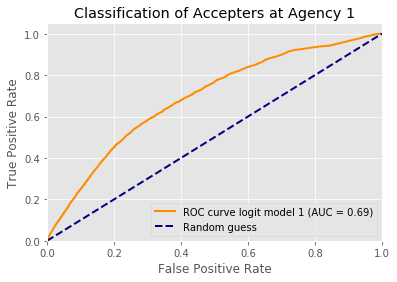

In [59]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 1 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 1')
plt.legend(loc='lower right')
plt.show()

In [60]:
dft = df[df.agency_id == '2'][columns].dropna().copy()
dft['Intercept'] = 1

X = dft[[col for col in dft.select_dtypes('number') if col != 'label']]
y = dft['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.189502
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               345815
Model:                          Logit   Df Residuals:                   345809
Method:                           MLE   Df Model:                            5
Date:                Mon, 11 May 2020   Pseudo R-squ.:                 0.06282
Time:                        00:38:50   Log-Likelihood:                -65533.
converged:                       True   LL-Null:                       -69925.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.2035      0.032     37.515      0.000       1.141       1.266
intensity_pushes         -0.0355      0.002    -16.066      0.000      -0.040      -0.031
distance_to_agency       -0.2544      0.006    -39.555      0.000      -0.267      -0.242
previous_work            -0.0094      0.001    -15.388      0.000      -0.011      -0.008
previous_work_10_days     0.1696      0.003     60.671      0.000       0.164       0.175
Intercept                -3.5799      0.019   -192.077      0.000      -3.616      -3.543
=========================================================================================
"""

In [61]:
for coef in [1.2035, -0.0355, -0.2544, -0.0094, 0.1696, -3.5799]:
    print(np.exp(coef)-1)

2.331757691428053
-0.0348772657699995
-0.22461841262727167
-0.009355958105965234
0.18483082419158348
-0.9721215140355444


In [62]:
np.exp(-3.5799) / (1 - np.exp(-3.5799))

0.028677984760078403

- if availability is true, then odds increases by more than 2 times
- if intensity pushes increase by one then odds decrease by less than 3.5% (weird)
- if distance increase by 1 km, then odds decrease by 22%
- if previous work increase by 1, then odds decrease by 0.9% (weird)
- if previous work in last 10 days increase by 1, then odds increase by 18.5%
- The probability base level to accept an itinerary is almost 3%

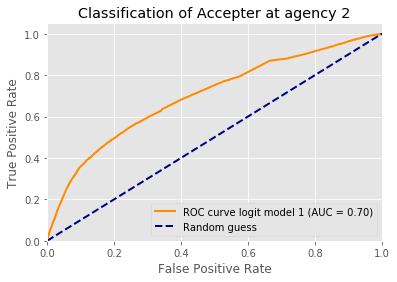

In [63]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])

plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 1 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepter at agency 2')
plt.legend(loc='lower right')
plt.show()

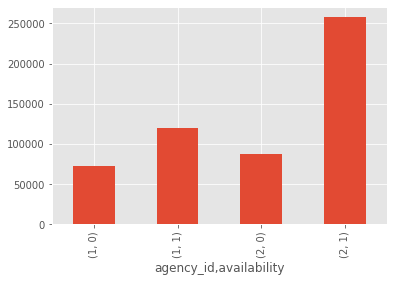

In [64]:
df.groupby(['agency_id', 'availability']).availability.count().plot.bar();

agency_id  availability
1          0               0.375361
           1               0.624639
2          0               0.253699
           1               0.746301
Name: availability, dtype: float64

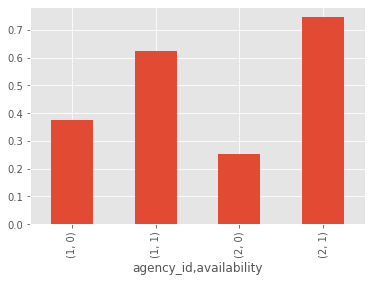

In [65]:
dft = df.groupby([df.agency_id, df.availability]).availability.count()
pct = dft / dft.groupby('agency_id').sum()
pct.plot.bar()
pct

agency_id  availability  label
1          0             0        0.352366
                         1        0.022995
           1             0        0.546749
                         1        0.077891
2          0             0        0.243931
                         1        0.009768
           1             0        0.704810
                         1        0.041490
Name: availability, dtype: float64

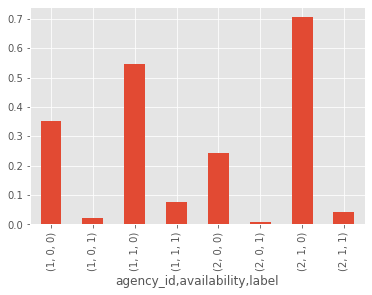

In [66]:
dft = df.groupby([df.agency_id, df.availability, df.label]).availability.count()
pct = dft / dft.groupby('agency_id').sum()
pct.plot.bar()
pct

In [67]:
df.offer_time = pd.to_datetime(df.offer_time)
df.set_index(df.offer_time, drop=True, inplace=True)

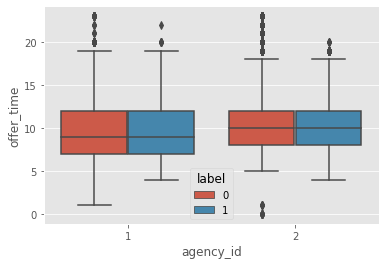

In [70]:
sns.boxplot(x='agency_id', y=df.offer_time.dt.hour, data=df, hue='label');

In [71]:
columns = [col for col in df.select_dtypes('number').columns if col not in ['driver_position_lat', 'driver_position_lng', 'previous_work']]
columns

['availability',
 'intensity_pushes',
 'distance_to_agency',
 'previous_work_10_days',
 'label']

In [72]:
df_Xy = df[df.agency_id=='1'][columns].copy()

In [73]:
df_Xy['hour'] = df_Xy.index.hour
df_Xy['weekend'] = df_Xy.index.dayofweek
df_Xy['weekend'] = df_Xy['weekend'].apply(lambda x: 0 if x < 5 else 1)

In [74]:
df_Xy.head()

,availability,intensity_pushes,distance_to_agency,previous_work_10_days,label,hour,weekend
offer_time,,,,,,,
2019-10-26 09:21:11,1,6,0.021653,10,1,9,1
2020-03-04 17:00:08,1,10,0.020956,14,1,17,0
2020-02-26 15:50:16,1,12,0.021263,15,1,15,0
2019-12-21 12:09:16,1,12,0.021599,21,1,12,1
2019-11-08 06:32:24,0,0,-1.000000,0,1,6,0


In [75]:
df_Xy.isna().sum()

availability             0
intensity_pushes         0
distance_to_agency       0
previous_work_10_days    0
label                    0
hour                     0
weekend                  0
dtype: int64

In [76]:
df_Xy['Intercept'] = 1

X = df_Xy[[col for col in df_Xy.select_dtypes('number') if col != 'label']]
y = df_Xy['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.307369
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               191653
Model:                          Logit   Df Residuals:                   191646
Method:                           MLE   Df Model:                            6
Date:                Mon, 11 May 2020   Pseudo R-squ.:                 0.06010
Time:                        00:40:19   Log-Likelihood:                -58908.
converged:                       True   LL-Null:                       -62675.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.3291      0.027     49.897      0.000       1.277       1.381
intensity_pushes         -0.0215      0.002    -10.089      0.000      -0.026      -0.017
distance_to_agency       -0.2026      0.005    -41.033      0.000      -0.212      -0.193
previous_work_10_days     0.0653      0.001     47.164      0.000       0.063       0.068
hour                      0.0097      0.003      3.834      0.000       0.005       0.015
weekend                  -0.3077      0.027    -11.516      0.000      -0.360      -0.255
Intercept                -3.1549      0.029   -109.062      0.000      -3.212      -3.098
=========================================================================================
"""

In [77]:
np.exp(0.0097) - 1, np.exp(-0.3077) - 1 

(0.009747197481755343, -0.2648641743210318)

- Weekend decreases odds in 26%
- Every hour increase 1%

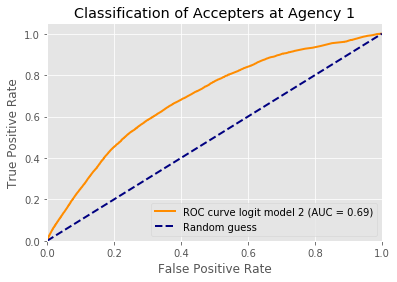

In [78]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 2 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 1')
plt.legend(loc='lower right')
plt.show()

In [79]:
df_Xy = df[df.agency_id=='2'][columns].copy()

In [80]:
df_Xy['hour'] = df_Xy.index.hour
df_Xy['weekend'] = df_Xy.index.dayofweek
df_Xy['weekend'] = df_Xy['weekend'].apply(lambda x: 0 if x < 5 else 1)

In [81]:
df_Xy.isna().sum()

availability             0
intensity_pushes         0
distance_to_agency       0
previous_work_10_days    0
label                    0
hour                     0
weekend                  0
dtype: int64

In [82]:
df_Xy['Intercept'] = 1

X = df_Xy[[col for col in df_Xy.select_dtypes('number') if col != 'label']]
y = df_Xy['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.188990
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               345815
Model:                          Logit   Df Residuals:                   345808
Method:                           MLE   Df Model:                            6
Date:                Mon, 11 May 2020   Pseudo R-squ.:                 0.06535
Time:                        00:41:10   Log-Likelihood:                -65356.
converged:                       True   LL-Null:                       -69925.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.2443      0.032     38.589      0.000       1.181       1.307
intensity_pushes         -0.0225      0.002     -9.752      0.000      -0.027      -0.018
distance_to_agency       -0.2695      0.006    -41.652      0.000      -0.282      -0.257
previous_work_10_days     0.1310      0.002     72.725      0.000       0.127       0.135
hour                     -0.0590      0.003    -17.506      0.000      -0.066      -0.052
weekend                   0.5387      0.028     18.988      0.000       0.483       0.594
Intercept                -3.1207      0.033    -93.247      0.000      -3.186      -3.055
=========================================================================================
"""

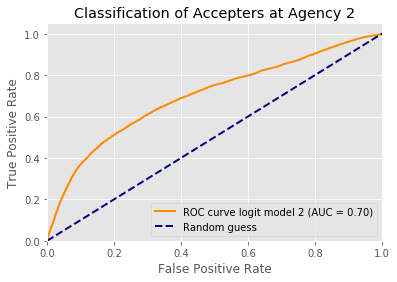

In [83]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 2 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 2')
plt.legend(loc='lower right')
plt.show()

In [85]:
# The file was generated by the weather script.
filename = '../data/weather_daily_2019-10-01_2020-03-25.json'

if not os.path.exists(filename):
    raise 'file not exists'

with open(filename) as f:
    data = json.load(f)

In [157]:
# json into dataframe
df_w = pd.DataFrame(data).T

# will drop any column not listed here
selection = """
precipIntensity, precipProbability,
temperatureHigh, windGust, cloudCover
"""
selection = [col.strip() for col in selection.split(',')]
for col in df_w.columns:
    if col not in selection:
        del df_w[col]
    elif col not in ['summary', 'icon']:
        # set column type to float
        df_w[col] = df_w[col].astype('float')

In [158]:
df_w.index.min()

'2019-10-01T00:00:00'

In [159]:
df = df[(df.offer_time > df_w.index.min()) & (df.offer_time < df_w.index.max())]

In [165]:
dfa = df[['agency_id'] + columns].copy()
df_w['date_'] = pd.to_datetime(df_w.index)
df_w['date_'] = df_w.date_.apply(lambda x: x.date())
dfa['date_'] = dfa.index.map(lambda x: x.date())

In [166]:
dfa = dfa.merge(df_w, left_on='date_', right_on='date_')
del df_w['date_']
del dfa['date_']

In [167]:
dfa.head(5)

,agency_id,availability,intensity_pushes,distance_to_agency,previous_work_10_days,label,precipIntensity,precipProbability,temperatureHigh,windGust,cloudCover
0,1,1,6,0.021653,10,1,0.0008,0.14,83.79,15.3,0.36
1,1,0,0,-1.000000,2,1,0.0008,0.14,83.79,15.3,0.36
2,1,0,0,-1.000000,0,0,0.0008,0.14,83.79,15.3,0.36
3,1,1,4,4.600170,12,1,0.0008,0.14,83.79,15.3,0.36
4,1,1,11,0.905607,1,0,0.0008,0.14,83.79,15.3,0.36


In [168]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 532950 entries, 0 to 532949
Data columns (total 11 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   agency_id              532950 non-null  object 
 1   availability           532950 non-null  int32  
 2   intensity_pushes       532950 non-null  int64  
 3   distance_to_agency     532950 non-null  float64
 4   previous_work_10_days  532950 non-null  int64  
 5   label                  532950 non-null  int32  
 6   precipIntensity        532950 non-null  float64
 7   precipProbability      532950 non-null  float64
 8   temperatureHigh        532950 non-null  float64
 9   windGust               532950 non-null  float64
 10  cloudCover             532950 non-null  float64
dtypes: float64(6), int32(2), int64(2), object(1)
memory usage: 44.7+ MB


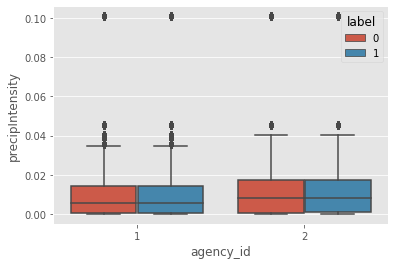

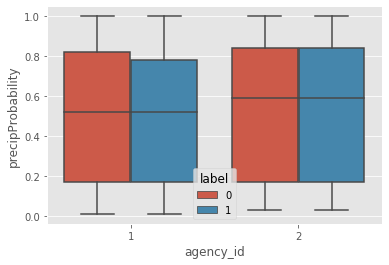

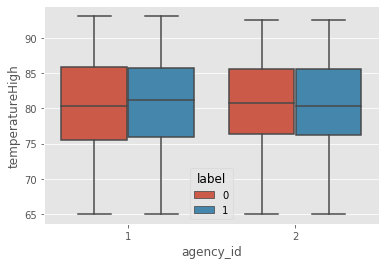

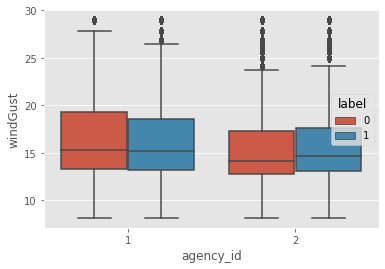

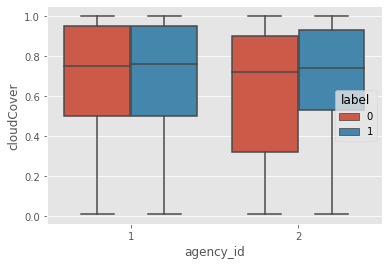

In [170]:
for col in df_w.columns:
    sns.boxplot(x='agency_id', y=col, hue='label', data=dfa);
    plt.show()

In [191]:
dfa.columns

Index(['agency_id', 'availability', 'intensity_pushes', 'distance_to_agency',
       'previous_work_10_days', 'label', 'precipIntensity',
       'precipProbability', 'temperatureHigh', 'windGust', 'cloudCover'],
      dtype='object')

In [192]:
columns = dfa.columns.tolist()
columns.remove('agency_id')

In [193]:
dft = dfa[dfa.agency_id == '1'][columns].dropna().copy()
dft['Intercept'] = 1

X = dft[[col for col in dft.select_dtypes('number') if col != 'label']]
y = dft['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.305664
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               190889
Model:                          Logit   Df Residuals:                   190879
Method:                           MLE   Df Model:                            9
Date:                Mon, 11 May 2020   Pseudo R-squ.:                 0.06044
Time:                        01:38:46   Log-Likelihood:                -58348.
converged:                       True   LL-Null:                       -62101.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.3530      0.027     50.301      0.000       1.300       1.406
intensity_pushes         -0.0203      0.002     -9.517      0.000      -0.024      -0.016
distance_to_agency       -0.2022      0.005    -40.851      0.000      -0.212      -0.193
previous_work_10_days     0.0649      0.001     46.320      0.000       0.062       0.068
precipIntensity          -5.6085      0.958     -5.854      0.000      -7.486      -3.731
precipProbability         0.2657      0.046      5.722      0.000       0.175       0.357
temperatureHigh           0.0063      0.001      4.406      0.000       0.003       0.009
windGust                 -0.0044      0.002     -2.252      0.024      -0.008      -0.001
cloudCover               -0.0253      0.041     -0.611      0.541      -0.107       0.056
Intercept                -3.6153      0.132    -27.370      0.000      -3.874      -3.356
=========================================================================================
"""

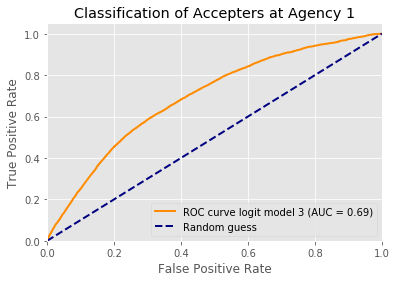

In [194]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 3 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 1')
plt.legend(loc='lower right')
plt.show()

In [195]:
dft = dfa[dfa.agency_id == '2'][columns].dropna().copy()
dft['Intercept'] = 1

X = dft[[col for col in dft.select_dtypes('number') if col != 'label']]
y = dft['label']
logit = sm.Logit(y, X)
logit_res = logit.fit()
logit_res.summary()

Optimization terminated successfully.
         Current function value: 0.189111
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  label   No. Observations:               342061
Model:                          Logit   Df Residuals:                   342051
Method:                           MLE   Df Model:                            9
Date:                Mon, 11 May 2020   Pseudo R-squ.:                 0.06398
Time:                        01:40:47   Log-Likelihood:                -64688.
converged:                       True   LL-Null:                       -69109.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
availability              1.1541      0.032     35.836      0.000       1.091       1.217
intensity_pushes         -0.0344      0.002    -15.524      0.000      -0.039      -0.030
distance_to_agency       -0.2496      0.006    -38.647      0.000      -0.262      -0.237
previous_work_10_days     0.1369      0.002     75.966      0.000       0.133       0.140
precipIntensity          -5.3009      0.882     -6.007      0.000      -7.030      -3.571
precipProbability        -0.2244      0.046     -4.891      0.000      -0.314      -0.134
temperatureHigh           0.0080      0.001      5.624      0.000       0.005       0.011
windGust                  0.0136      0.002      6.737      0.000       0.010       0.018
cloudCover                0.7535      0.044     17.222      0.000       0.668       0.839
Intercept                -4.7464      0.135    -35.286      0.000      -5.010      -4.483
=========================================================================================
"""

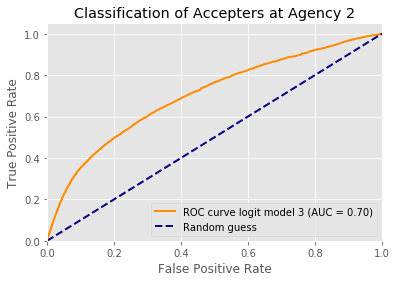

In [196]:
pred = logit_res.predict(X)
roc_p = roc_curve(y, pred)
auc_p = auc(roc_p[0], roc_p[1])


plt.figure()
line_width = 2
plt.plot(roc_p[0], roc_p[1], color='darkorange',
         lw=line_width, label=f'ROC curve logit model 3 (AUC = {auc_p:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Accepters at Agency 2')
plt.legend(loc='lower right')
plt.show()

Let's get serious

In [178]:
def compute_AUC(X, y, train_index, test_index):
    """
    feature/output: X, y
    dataset split: train_index, test_index
    """
    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
    X_test, y_test = X.iloc[test_index], y.iloc[test_index]
    
    logit = sm.Logit(y_train, X_train)
    logit_res = logit.fit()
    logit_res.summary()
    
    pred = logit_res.predict(X_test)
    fpr, tpr, _ = roc_curve(y_test, pred)
    auc_score = auc(fpr, tpr)
    
    return auc_score, fpr, tpr

In [179]:
def cross_validation_AUC(X, y, nfold=10):
    """
    use a n-fold cross-validation for computing AUC estimates
    """
    skf = StratifiedKFold(n_splits=nfold)  #create a cross-validation splitting
    auc_list = [] #this list will contain the AUC estimates associated with each fold
    for k, (train_index, test_index) in enumerate( skf.split(X, y) ):
        auc_score, _, _ = compute_AUC(X, y, train_index, test_index)
        auc_list.append(auc_score)
    return auc_list

In [181]:
dfa.keys()

Index(['agency_id', 'availability', 'intensity_pushes', 'distance_to_agency',
       'previous_work_10_days', 'label', 'precipIntensity',
       'precipProbability', 'temperatureHigh', 'windGust', 'cloudCover'],
      dtype='object')

In [183]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 532950 entries, 0 to 532949
Data columns (total 11 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   agency_id              532950 non-null  object 
 1   availability           532950 non-null  int32  
 2   intensity_pushes       532950 non-null  int64  
 3   distance_to_agency     532950 non-null  float64
 4   previous_work_10_days  532950 non-null  int64  
 5   label                  532950 non-null  int32  
 6   precipIntensity        532950 non-null  float64
 7   precipProbability      532950 non-null  float64
 8   temperatureHigh        532950 non-null  float64
 9   windGust               532950 non-null  float64
 10  cloudCover             532950 non-null  float64
dtypes: float64(6), int32(2), int64(2), object(1)
memory usage: 64.7+ MB


In [186]:
# this data-frame will contain the AUC estimates
model_perf = pd.DataFrame({})
for a, g in dfa.groupby('agency_id'):
    for key in g[columns].keys():
        if key == "label": continue
        X_full, y_full = g[[key]], g['label']
        auc_list = cross_validation_AUC(X_full, y_full, nfold=10)
        model_perf["{} - SIMPLE: {}".format(a, key)] = auc_list

Optimization terminated successfully.
         Current function value: 0.496775
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.486189
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498170
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.496728
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.495898
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.497815
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.495928
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.494073
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.496159
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.494410
  

Optimization terminated successfully.
         Current function value: 0.365464
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.362811
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.365814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.369034
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.362078
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.363959
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.363627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.366048
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.369831
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.332687
  

Optimization terminated successfully.
         Current function value: 0.218274
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.219022
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.216206
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.219350
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.219040
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.218569
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.220915
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.218360
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.264861
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.258777
  

In [188]:
def plot_boxplot_ordered(df_model):
    """
    display a list of boxplot, ordered by the media values
    """
    df = df_model[df_model.median().sort_values().index]
    sns.boxplot(x="variable", y="value", data=pd.melt(df), showfliers=False)
    plt.xticks(rotation=90)

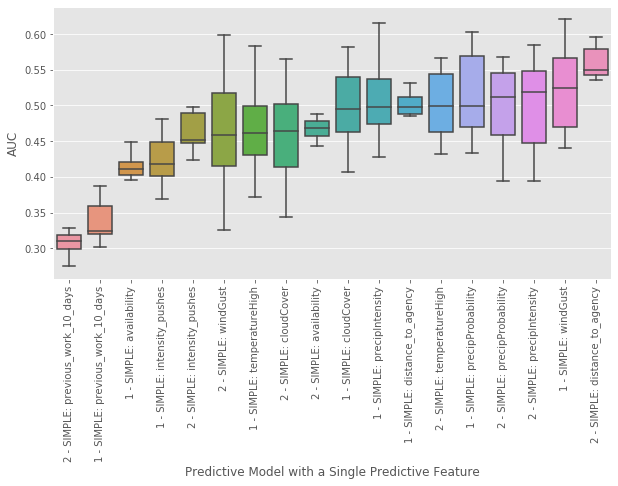

In [190]:
plt.figure(figsize= (10,5))
plot_boxplot_ordered(model_perf)
plt.xlabel("Predictive Model with a Single Predictive Feature")
plt.ylabel("AUC");